In [120]:
import pandas as pd
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px
import matplotlib.pyplot as plt
import tqdm
import numpy as np
import seaborn as sns
import os
import configparser

# make sure that cwd is the root of the project i.e. not the folder notebooks
if 'notebooks' in os.getcwd():
    os.chdir('..')

config = configparser.ConfigParser()
config.read('config.ini')

PROCESSED_DATA_DIR = os.path.join(os.getcwd(), config['PREPROCESSING']['processed_data_dir'])
TEST_DATA_PATH = os.path.join(PROCESSED_DATA_DIR, 'test')
SINGLE_NODE_TO_READ = 'e2205'
RECONSTRUCTED_DATA_DIR = os.path.join(os.getcwd(), config['EVALUATION']['logs_path'], "eval-['2023-03-01', '2023-03-30']")
VISUALIZATION_DIR = os.path.join(os.getcwd(), RECONSTRUCTED_DATA_DIR, 'visualization')

if not os.path.exists(VISUALIZATION_DIR):
    os.makedirs(VISUALIZATION_DIR)

print(PROCESSED_DATA_DIR)
print(TEST_DATA_PATH)
print('Node for analysis: ', SINGLE_NODE_TO_READ)

/home/ignacys/Desktop/admire/data/processed/all_march_top200_withalloc_and_augm_fixed_hours
/home/ignacys/Desktop/admire/data/processed/all_march_top200_withalloc_and_augm_fixed_hours/test
Node for analysis:  e2205


In [44]:
node_result_path = f'{TEST_DATA_PATH}/{SINGLE_NODE_TO_READ}.parquet'
print('Path to read: ', node_result_path)
df = pd.read_parquet(node_result_path)
df.info()

dates_range = {}
dates_range['start'] = pd.to_datetime(df['date'].min())
dates_range['end'] =  pd.to_datetime(df['date'].max())
print(f'\nNumber of days: {dates_range["end"] - dates_range["start"]}, from {dates_range["start"]} to {dates_range["end"]}\n')
print('Describe: \n', df.describe())

Path to read:  /home/ignacys/Desktop/admire/data/processed/all_march_top200_withalloc_and_augm_fixed_hours/test/e2205.parquet
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41701 entries, 0 to 41700
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype                        
---  ------      --------------  -----                        
 0   date        41701 non-null  datetime64[ns, Europe/Warsaw]
 1   power       41701 non-null  float64                      
 2   cpu1        41701 non-null  float64                      
 3   cpu2        41701 non-null  float64                      
 4   cpus_alloc  41701 non-null  float64                      
dtypes: datetime64[ns, Europe/Warsaw](1), float64(4)
memory usage: 1.6 MB

Number of days: 28 days 23:00:00, from 2023-03-01 00:00:00+01:00 to 2023-03-30 00:00:00+02:00

Describe: 
               power          cpu1          cpu2    cpus_alloc
count  41701.000000  41701.000000  41701.000000  41701.000000
mean     204.552888

In [26]:
fig = make_subplots(rows=4, cols=1)

for i, col in tqdm.tqdm(enumerate(df.drop(['date'], axis=1).columns), desc='Plotting'):
    fig.add_trace(go.Scatter(x = df["date"], y = df[col], mode='lines', name=col), row=i+1, col=1)

fig.show()

Plotting: 0it [00:00, ?it/s]

Plotting: 4it [00:01,  2.23it/s]


In [45]:
dates_range['start']

Timestamp('2023-03-01 00:00:00+0100', tz='Europe/Warsaw')

In [119]:


rec = pd.read_parquet(os.path.join(RECONSTRUCTED_DATA_DIR, 'recon_error.parquet')).T
rec = rec[SINGLE_NODE_TO_READ]
values = rec.values
dates = [pd.to_datetime(d) for d in rec.index]

print(len(dates))
print(len(values))

41642
41642


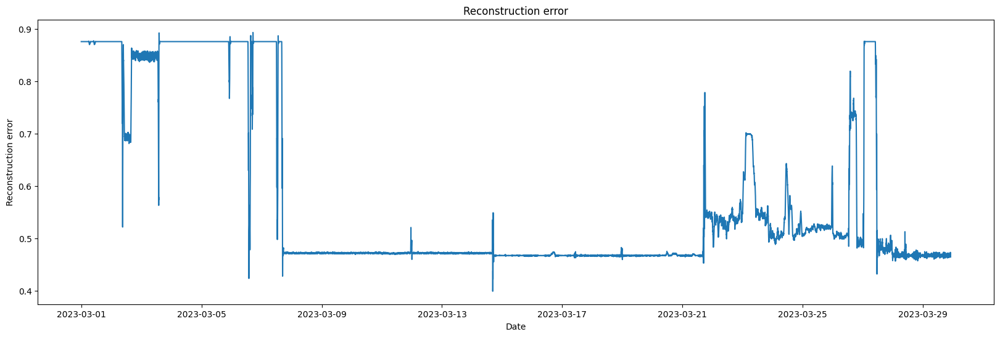

In [67]:
plt.figure(figsize=(20, 6))
plt.plot(dates, values, label='Reconstruction error')
plt.title('Reconstruction error')
plt.xlabel('Date')
plt.ylabel('Reconstruction error')
plt.show()

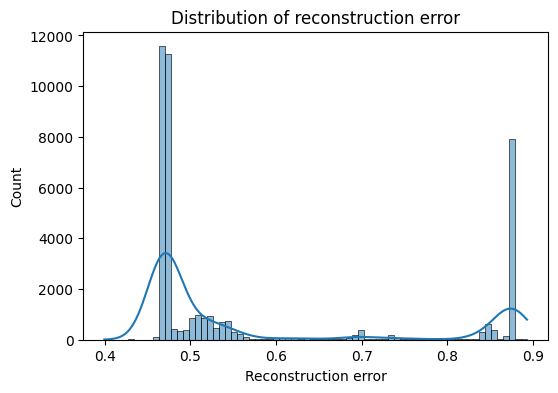

In [94]:
# Check the distribution of the reconstruction error
def plot_distribution(values, title: str, xlabel: str, ylabel: str):
    fig, ax = plt.subplots(figsize=(6, 4))
    sns.histplot(values, bins=int(len(values)**0.4), kde=True, ax=ax)
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    plt.show()

plot_distribution(values, 'Distribution of reconstruction error', 'Reconstruction error', 'Count')

Number of outliers with 1 std: 9718 out of 41642, which is 23.34%
Number of outliers with 2 std: 0 out of 41642, which is 0.00%
Number of outliers with 2.5 std: 0 out of 41642, which is 0.00%
Number of outliers with 3 std: 0 out of 41642, which is 0.00%
Number of outliers with 4 std: 0 out of 41642, which is 0.00%


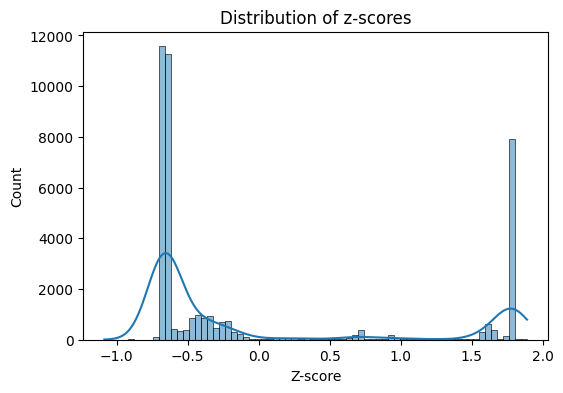

In [111]:
def calculate_z_score(data):
    return (data - np.mean(data)) / np.std(data)

def get_nth_percentile(data, n):
    return np.percentile(data, n)

def get_mask_for_outliers(data, threshold):
    return data > threshold

zscores = calculate_z_score(values)

for s in [1,2,2.5,3,4]:
    zscores_mask = get_mask_for_outliers(zscores, s)
    print(f'Number of outliers with {s} std: {np.sum(zscores_mask)} out of {len(zscores)}, which is {np.sum(zscores_mask)/len(zscores)*100:.2f}%')

plot_distribution(zscores, 'Distribution of z-scores', 'Z-score', 'Count')

In [110]:
for perc in [80, 90, 95, 99]:
    percentile = get_nth_percentile(values, perc)
    percentile_mask = get_mask_for_outliers(values, percentile)
    print(f'Number of outliers with {perc}th percentile: {np.sum(percentile_mask)} out of {len(values)}, which is {np.sum(percentile_mask) / len(values) * 100:.4}%')

print('Number of all values: ', len(values))

Number of outliers with 80th percentile: 8329 out of 41642, which is 20.0%
Number of outliers with 90th percentile: 105 out of 41642, which is 0.2521%
Number of outliers with 95th percentile: 105 out of 41642, which is 0.2521%
Number of outliers with 99th percentile: 105 out of 41642, which is 0.2521%
Number of all values:  41642


In [116]:
percentile80 = get_nth_percentile(values, 80)
percentile80_mask = get_mask_for_outliers(values, percentile80).astype(int)
percentile90 = get_nth_percentile(values, 90)
percentile90_mask = get_mask_for_outliers(values, percentile90).astype(int)

In [122]:
fig = make_subplots(rows=4, cols=1)

fig.add_trace(go.Scatter(x = dates, y = values, mode='lines', name='Reconstruction'), row=1, col=1)
fig.add_trace(go.Scatter(x = dates, y = zscores, mode='lines', name='Z-score'), row=2, col=1)
fig.add_trace(go.Scatter(x = dates, y = percentile80_mask, mode='lines', name='Percentile 80 mask'), row=3, col=1)
fig.add_trace(go.Scatter(x = dates, y = percentile90_mask, mode='lines', name='Percentile 90 mask'), row=4, col=1)

# save the plot to RECONSTRUCTED_DATA_DIR
fig.write_html(os.path.join(VISUALIZATION_DIR, f'4metrics_on_{SINGLE_NODE_TO_READ}.html'))
fig.write_image(os.path.join(VISUALIZATION_DIR, f'4metrics_on_{SINGLE_NODE_TO_READ}.png'))

fig.show()